In [1]:
import os
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib as mpl

graphs_dir = "results2/graphs"
os.makedirs("../"+graphs_dir, exist_ok=True)
os.makedirs("../"+graphs_dir+"/means", exist_ok=True)

stats_dir = "results2/stats"
os.makedirs("../"+stats_dir, exist_ok=True)

noises = [0] + [round(i*0.01, 2) for i in range(1, 11)]
tests = ['testAB', 'testAG', 'test']


In [2]:
methods_lst = ['aligns', 'grad01_avg', 'grad01_max', 'gradient_conf_avg', 
               'gradient_conf_max', 'gradient_input_avg', 'gradient_input_max', 
               'hamming_max', 'hamming_min', 'model_grad_avg', 'model_grad_max', 
               'qbc', 'threshold_avg', 'threshold_max', 'random', 'feature_cosine', 'feature_eucl']

base_palette = [
    "#000000", "#004949", "#009292", "#ff6db6", "#ffb6db",
    "#490092", "#006ddb", "#b66dff", "#6db6ff", "#b6dbff",
    "#920000", "#924900", "#db6d00", "#24ff24", "#ffff6d", "#ff0000", "#ffa500"
]

user_palette = {methods_lst[i]: base_palette[i] for i in range(len(methods_lst))}
method_colors = dict(user_palette)

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

try:
    cmap = mpl.colormaps.get_cmap("tab20")
except AttributeError:
    cmap = plt.get_cmap("tab20")

if hasattr(cmap, "colors"):
    base_colors = list(cmap.colors)
else:
    N = getattr(cmap, "N", 20)
    base_colors = [cmap(i / max(N - 1, 1)) for i in range(N)]

all_methods = methods_lst
missing = [m for m in all_methods if m not in method_colors]
for i, method in enumerate(missing):
    rgba = base_colors[i % len(base_colors)]
    method_colors[method] = mcolors.to_hex(rgba)

method_labels = {m: m.replace('_', ' ') for m in methods_lst}


# noise split


--- processing noise=0 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.png


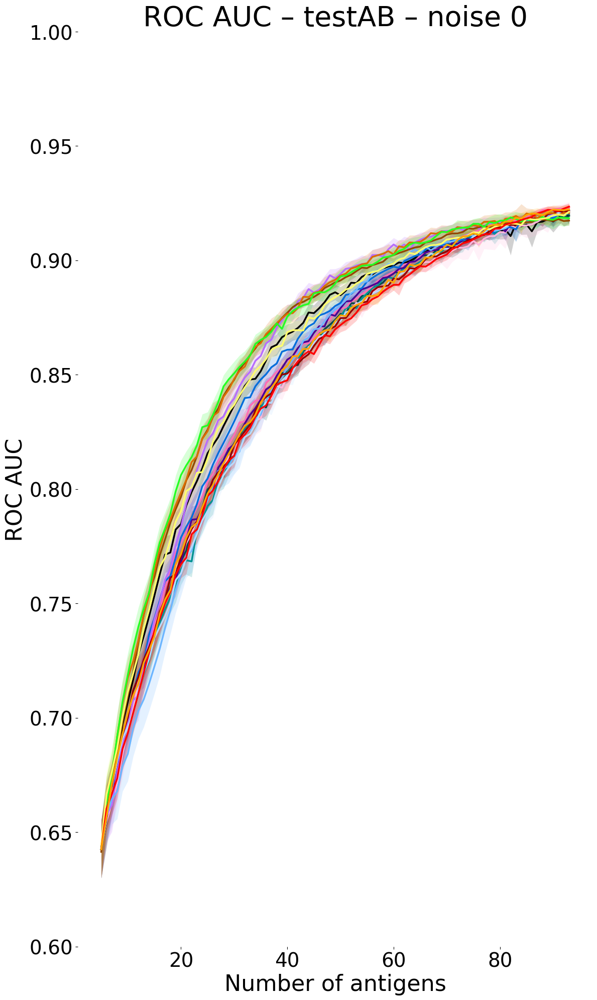

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.png


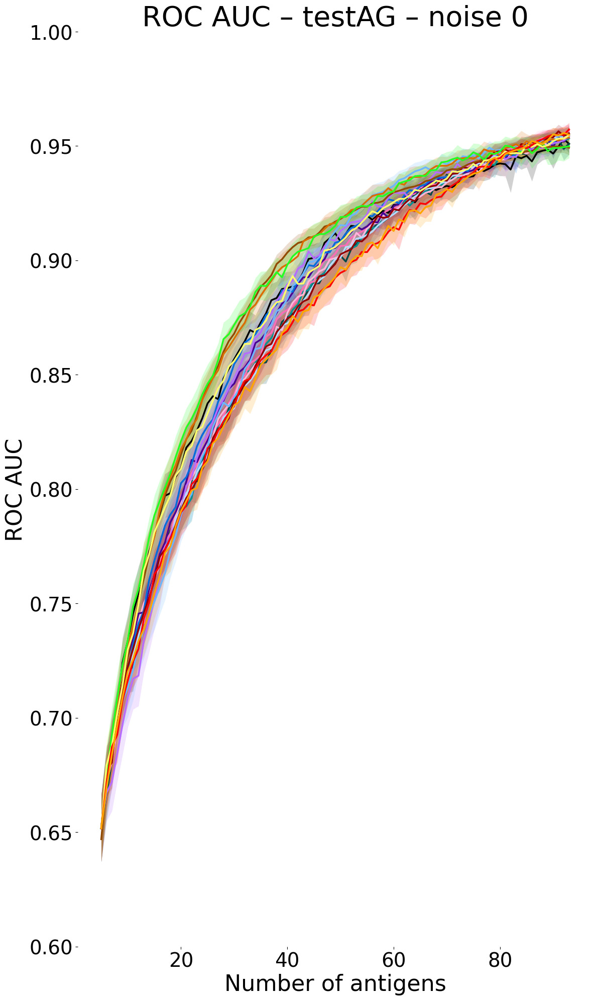

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.png


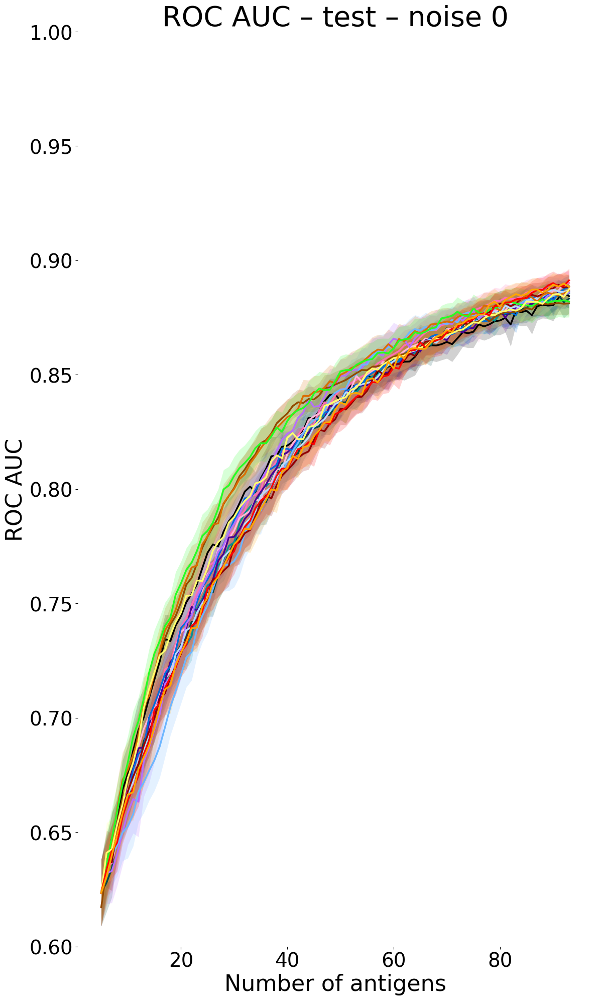

Collected dfw for noise=0, shape=(151300, 8)

--- processing noise=0.01 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.01.png


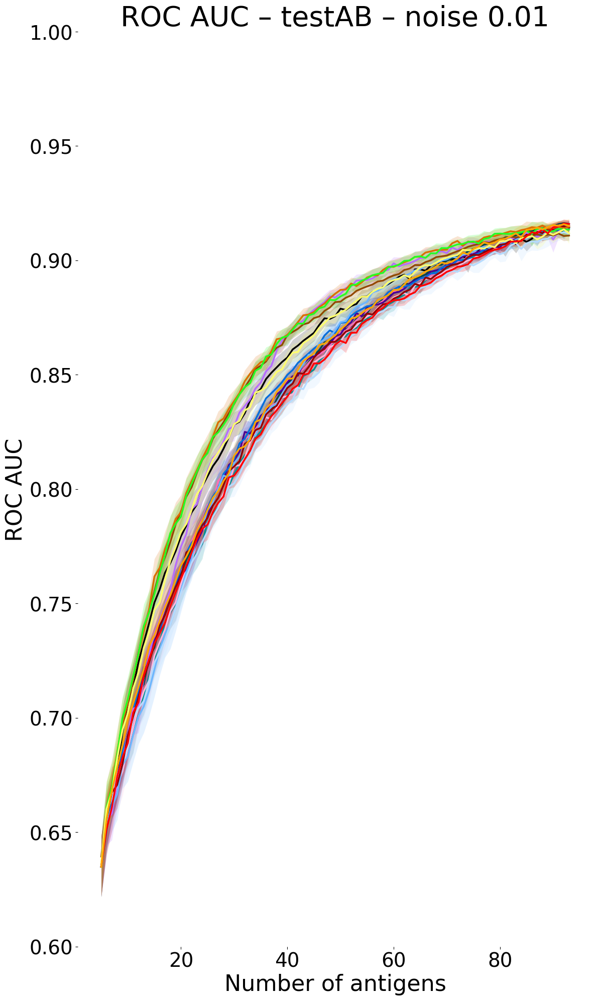

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.01.png


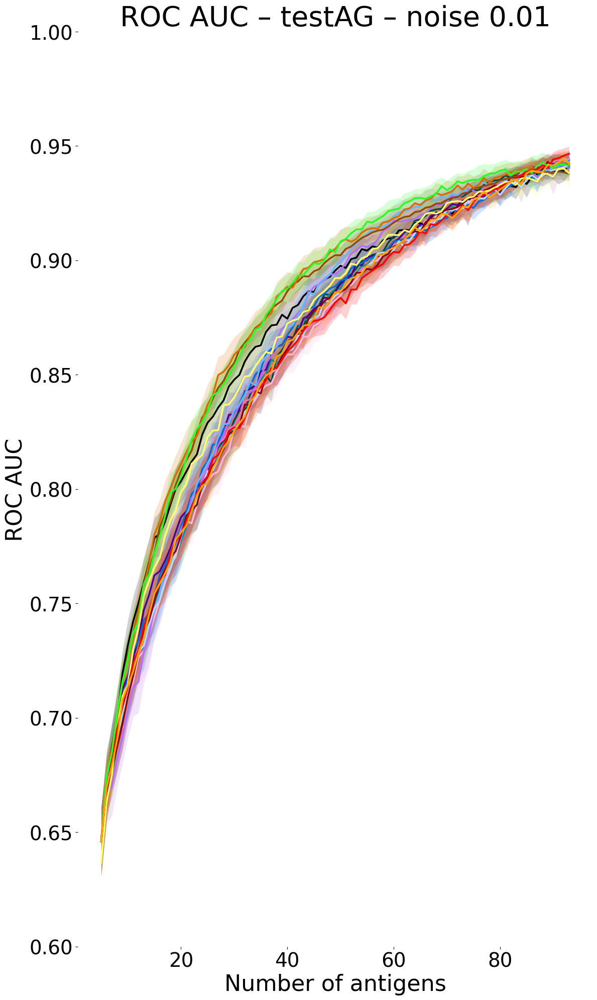

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.01.png


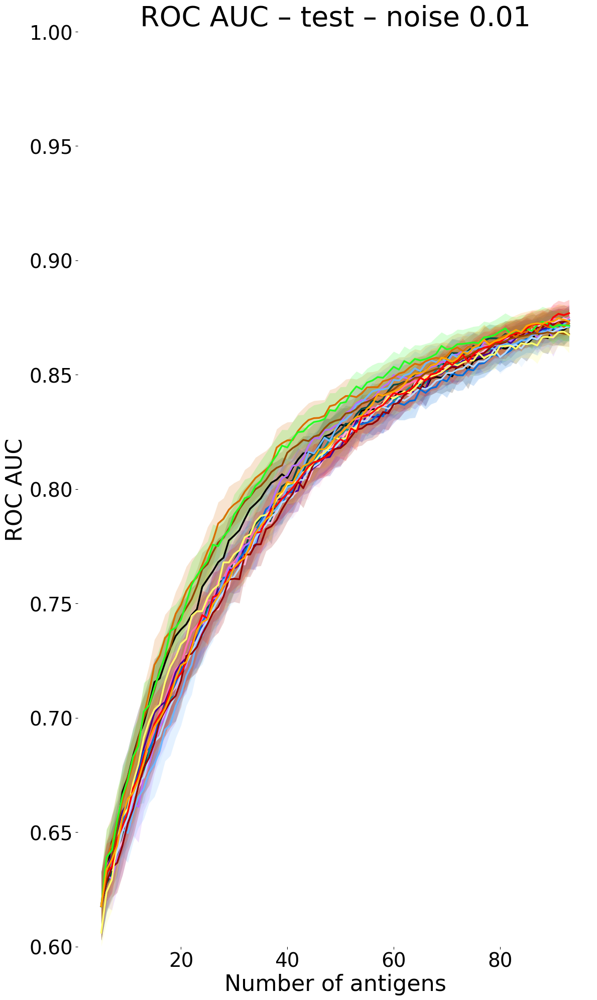

Collected dfw for noise=0.01, shape=(151300, 8)

--- processing noise=0.02 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.02.png


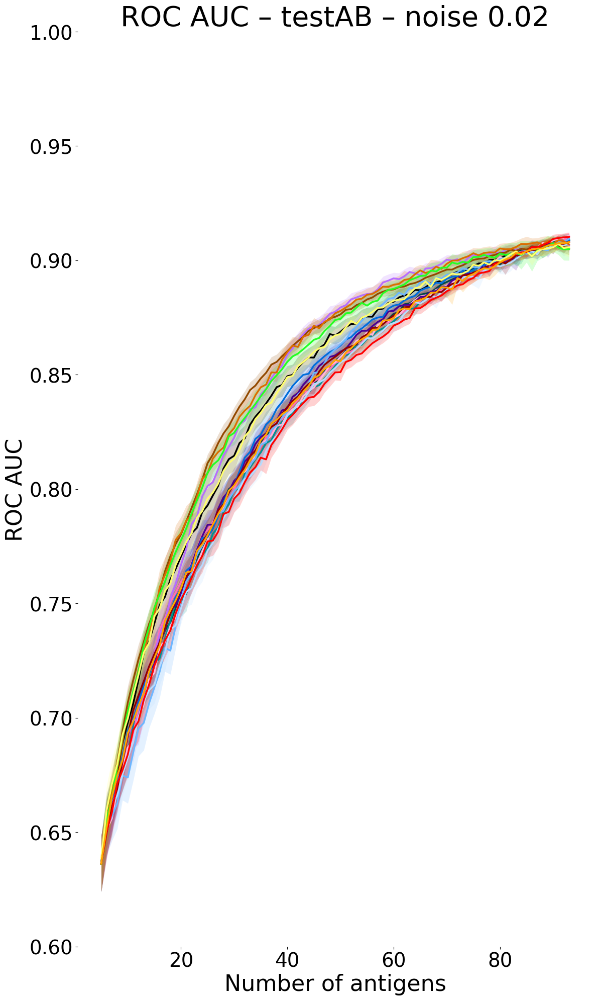

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.02.png


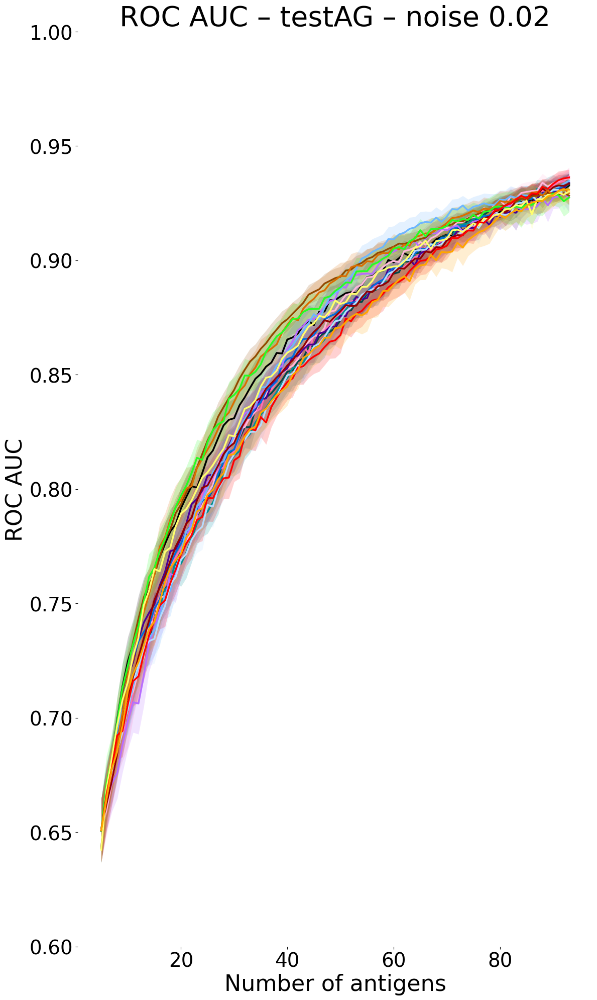

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.02.png


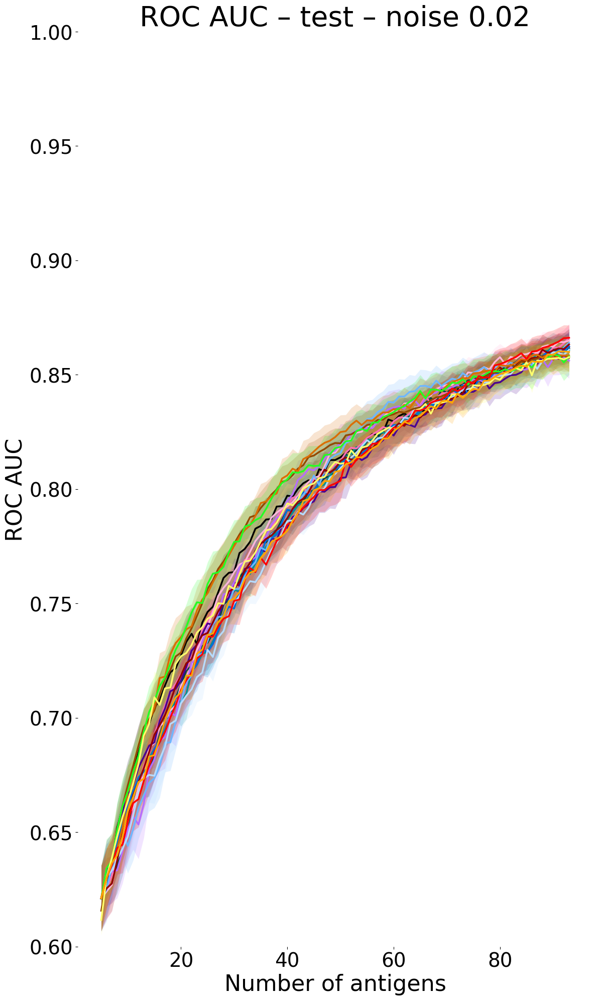

Collected dfw for noise=0.02, shape=(151300, 8)

--- processing noise=0.03 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.03.png


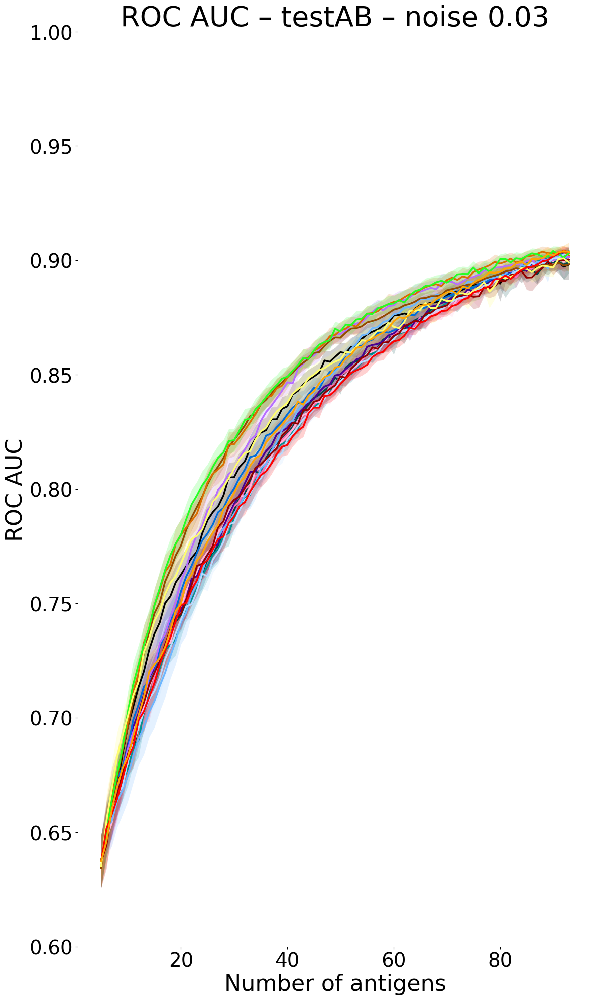

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.03.png


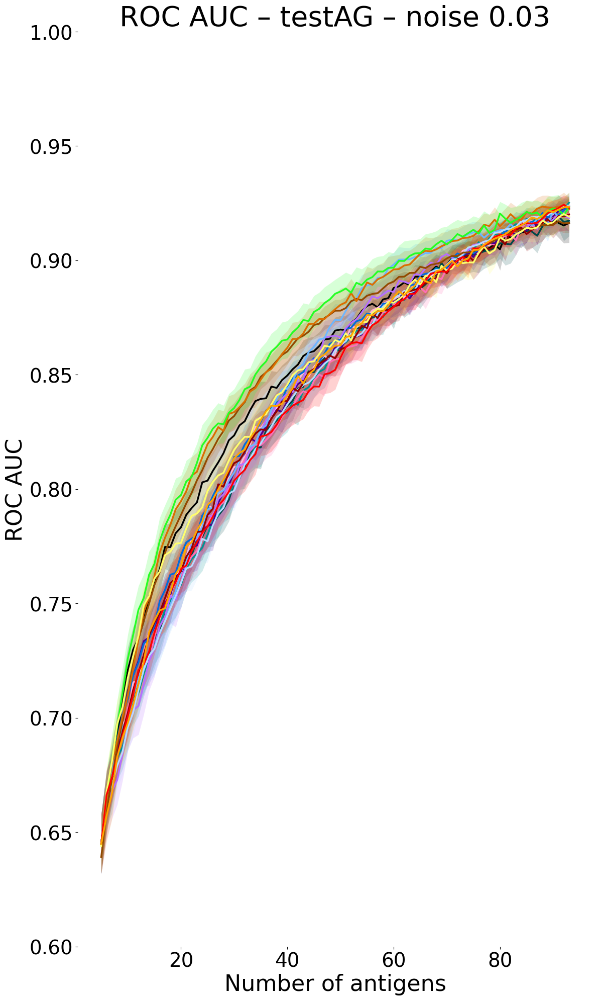

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.03.png


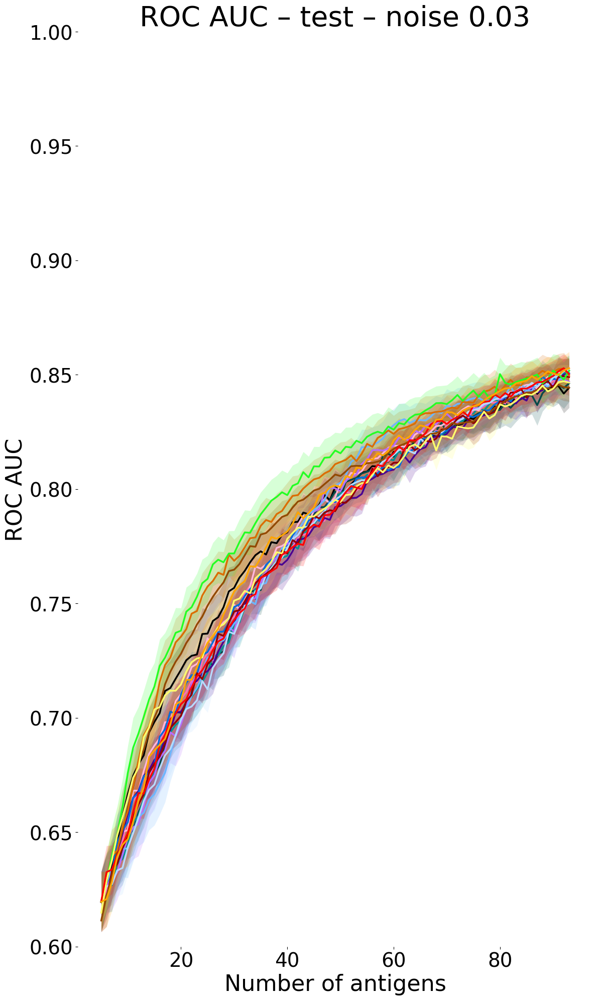

Collected dfw for noise=0.03, shape=(151300, 8)

--- processing noise=0.04 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.04.png


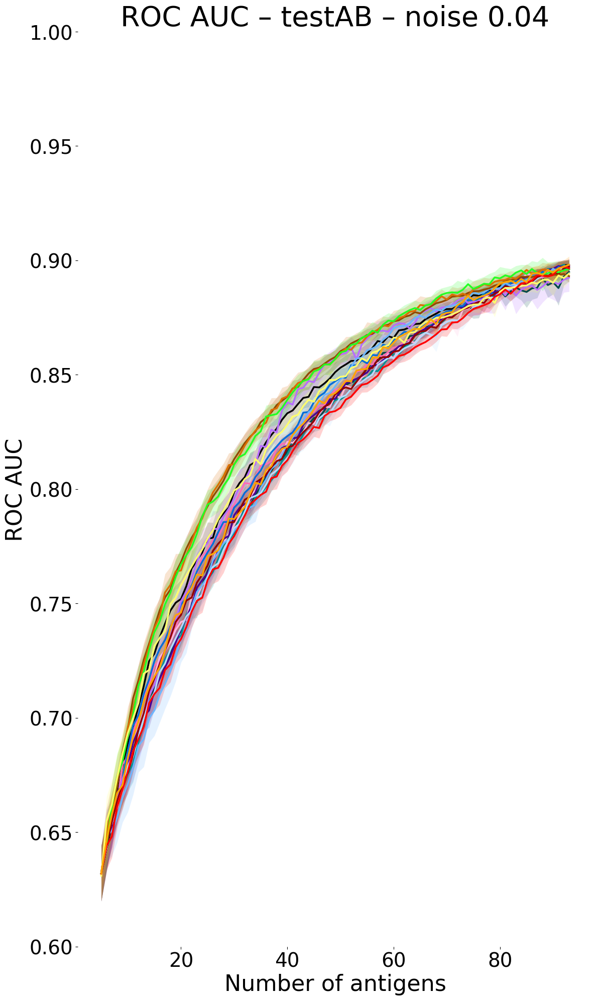

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.04.png


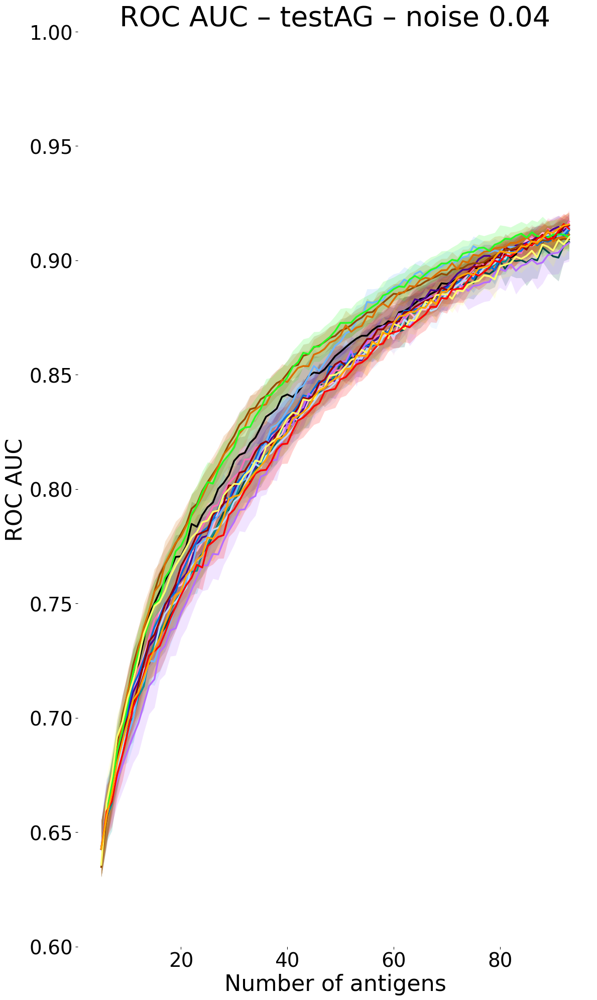

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.04.png


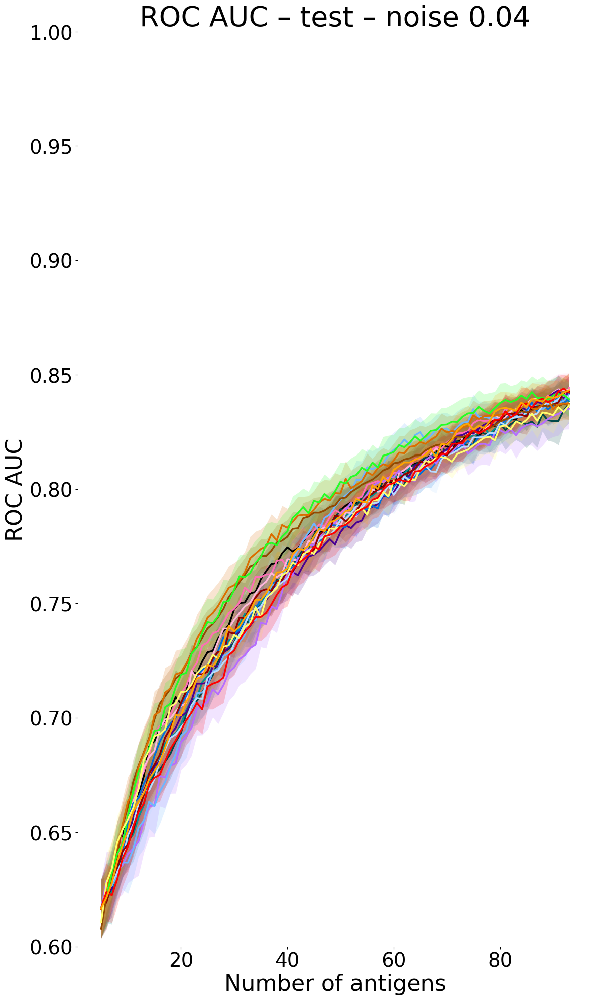

Collected dfw for noise=0.04, shape=(151300, 8)

--- processing noise=0.05 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.05.png


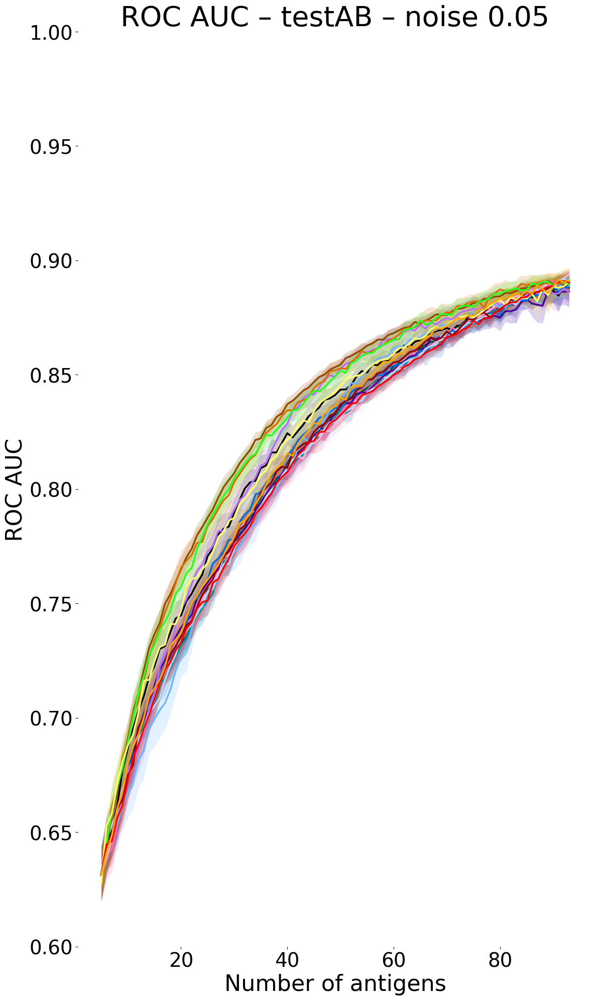

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.05.png


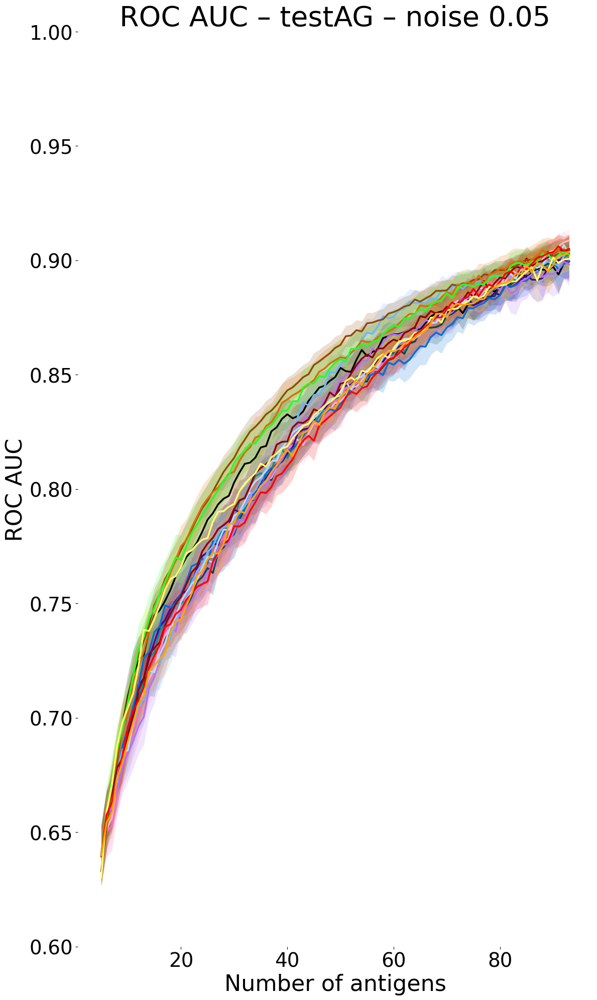

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.05.png


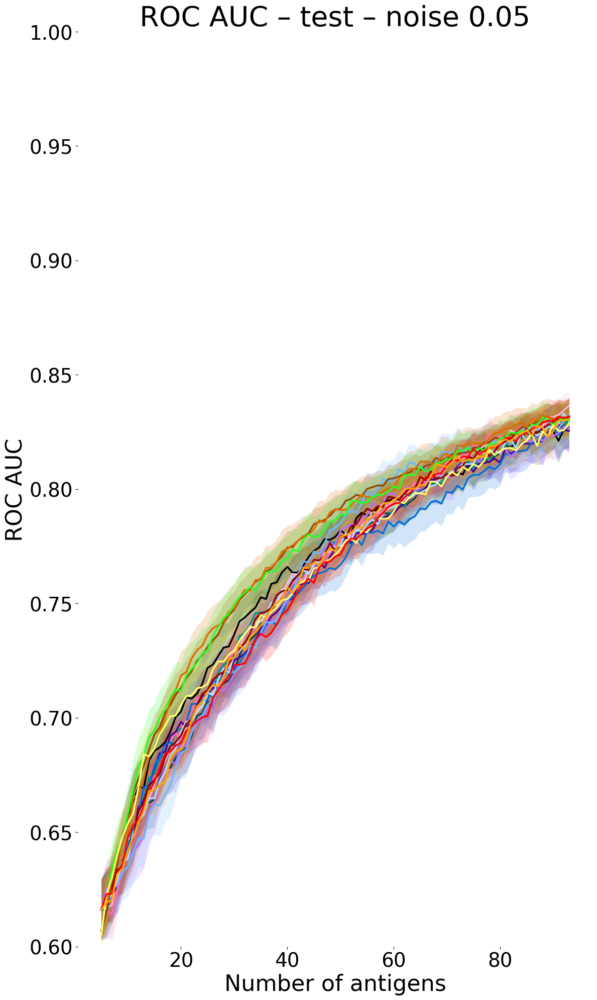

Collected dfw for noise=0.05, shape=(151300, 8)

--- processing noise=0.06 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.06.png


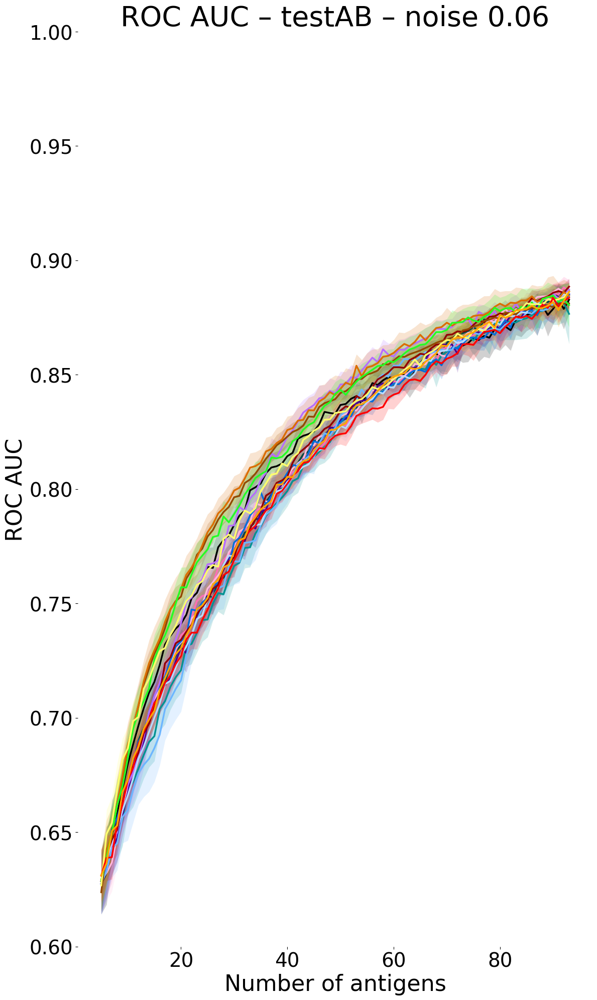

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.06.png


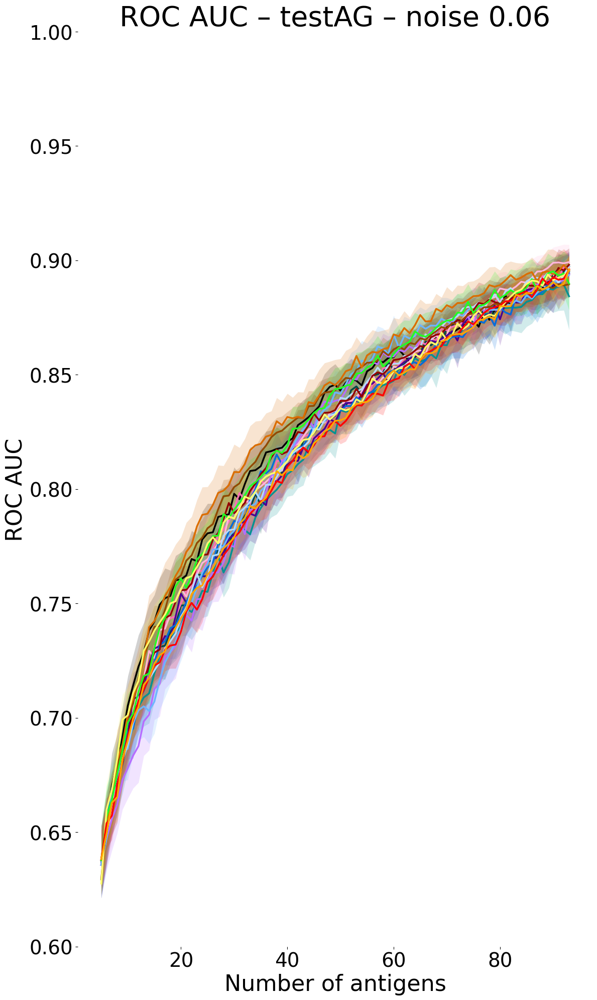

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.06.png


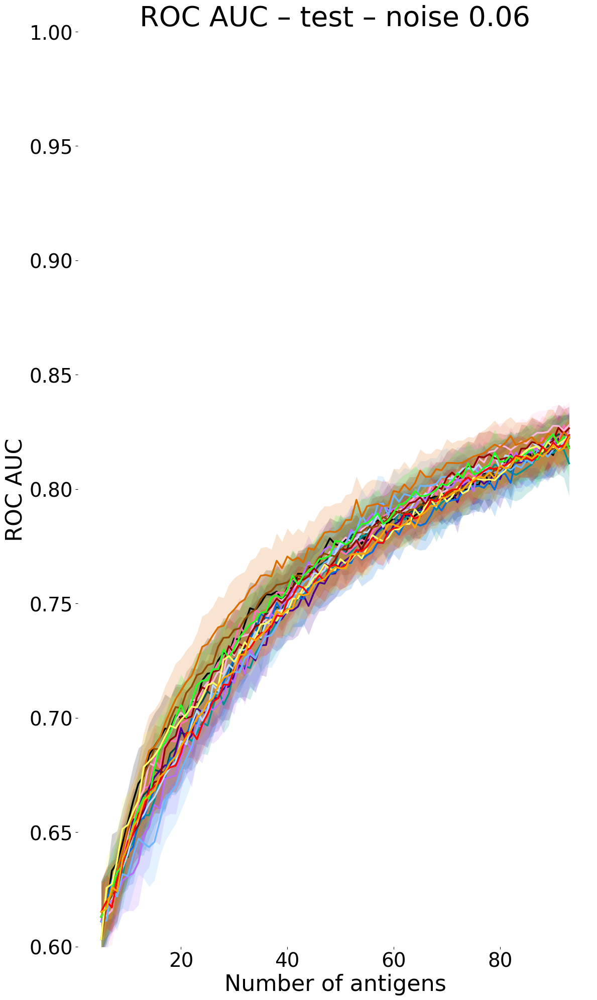

Collected dfw for noise=0.06, shape=(106800, 8)

--- processing noise=0.07 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.07.png


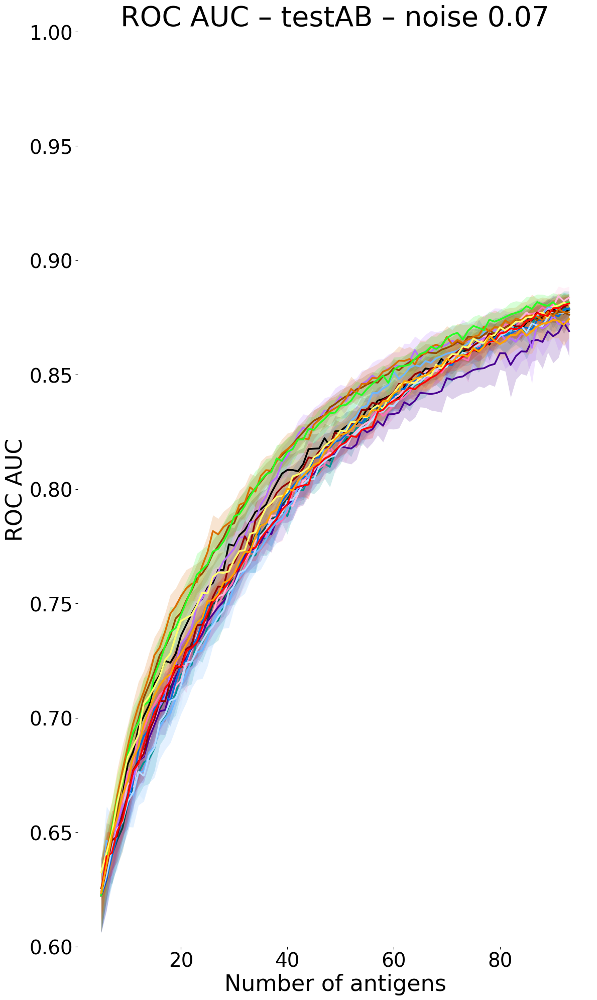

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.07.png


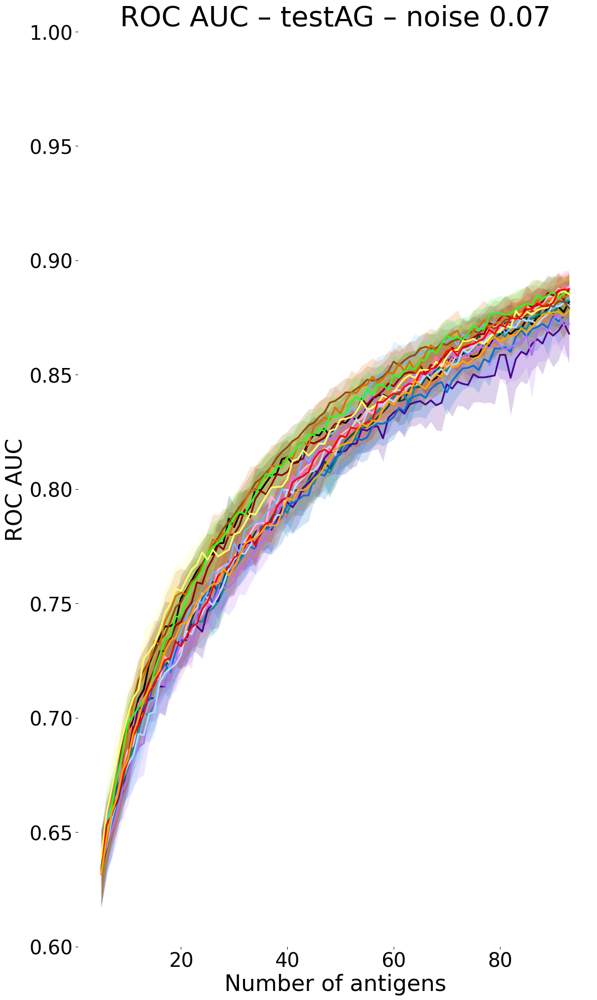

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.07.png


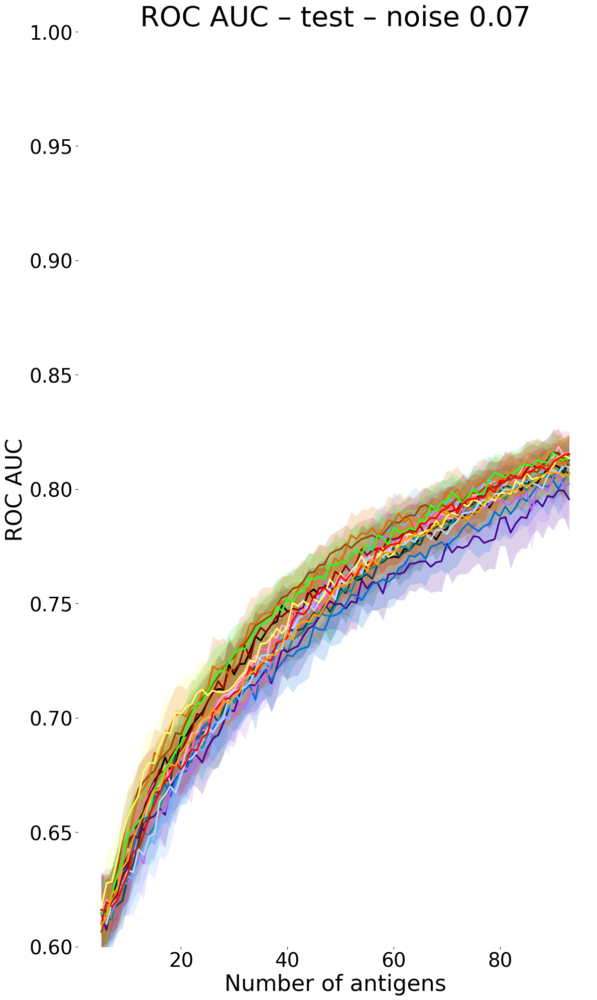

Collected dfw for noise=0.07, shape=(106800, 8)

--- processing noise=0.08 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.08.png


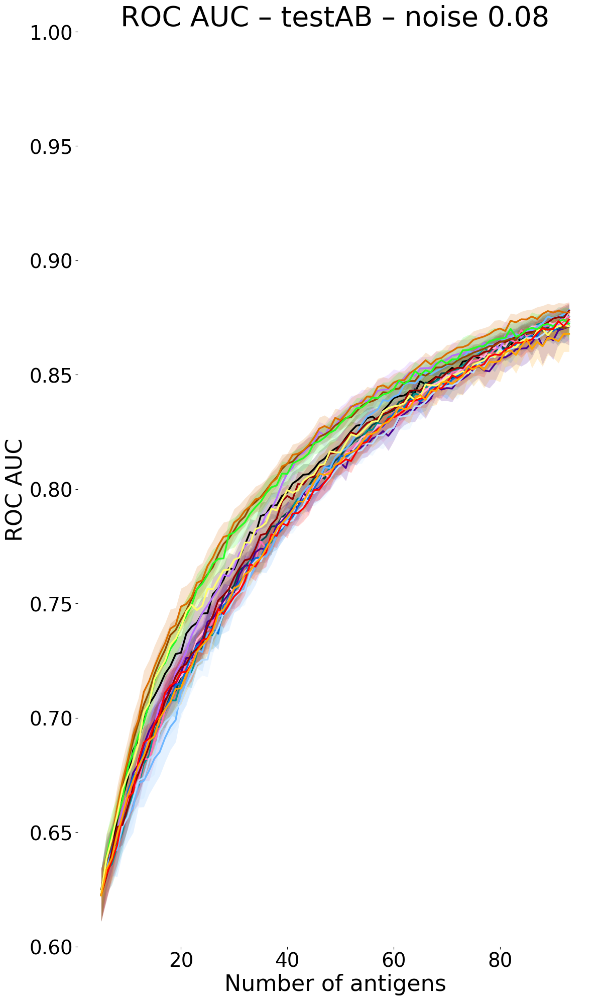

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.08.png


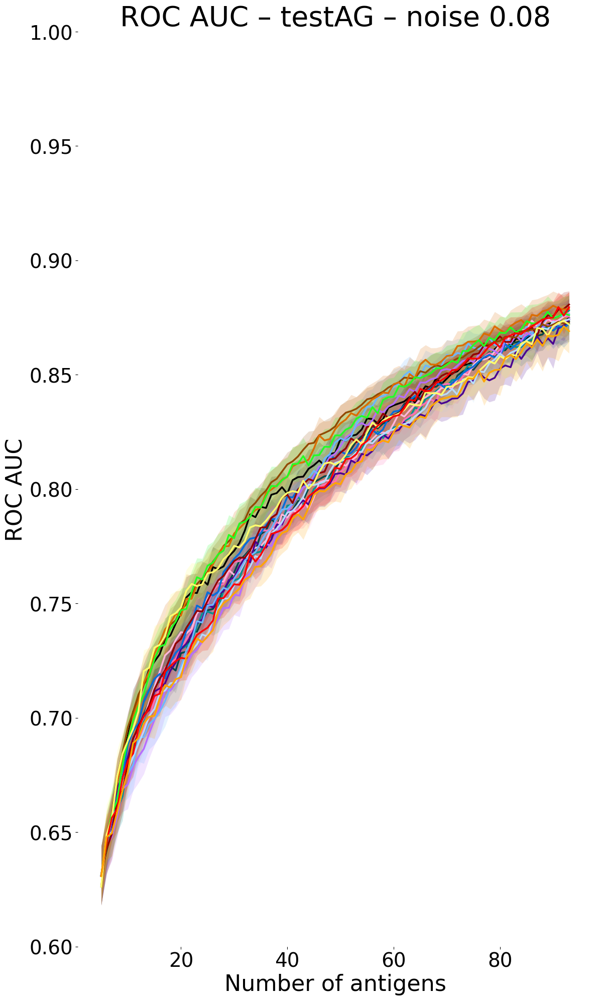

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.08.png


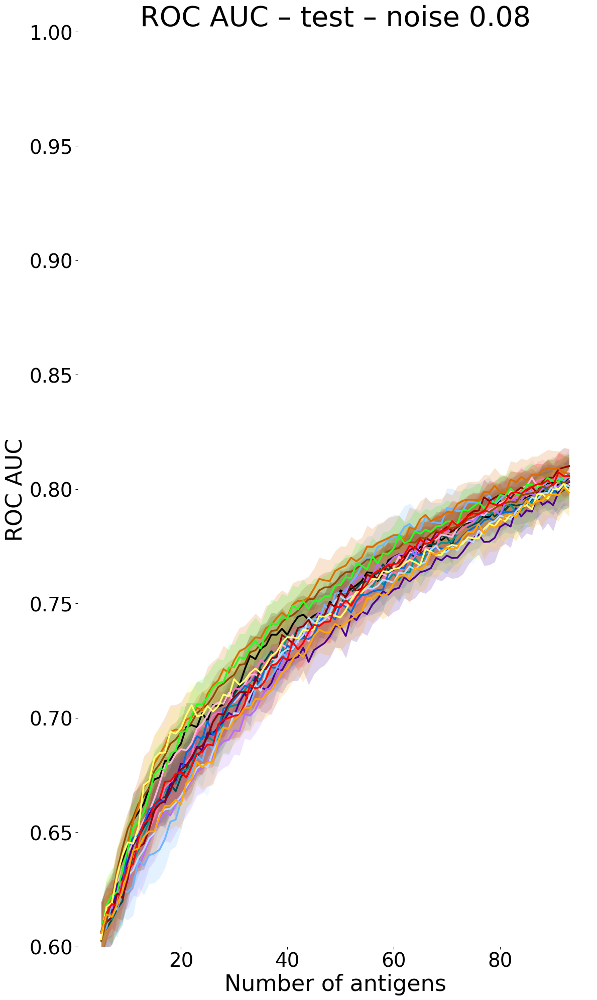

Collected dfw for noise=0.08, shape=(151300, 8)

--- processing noise=0.09 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.09.png


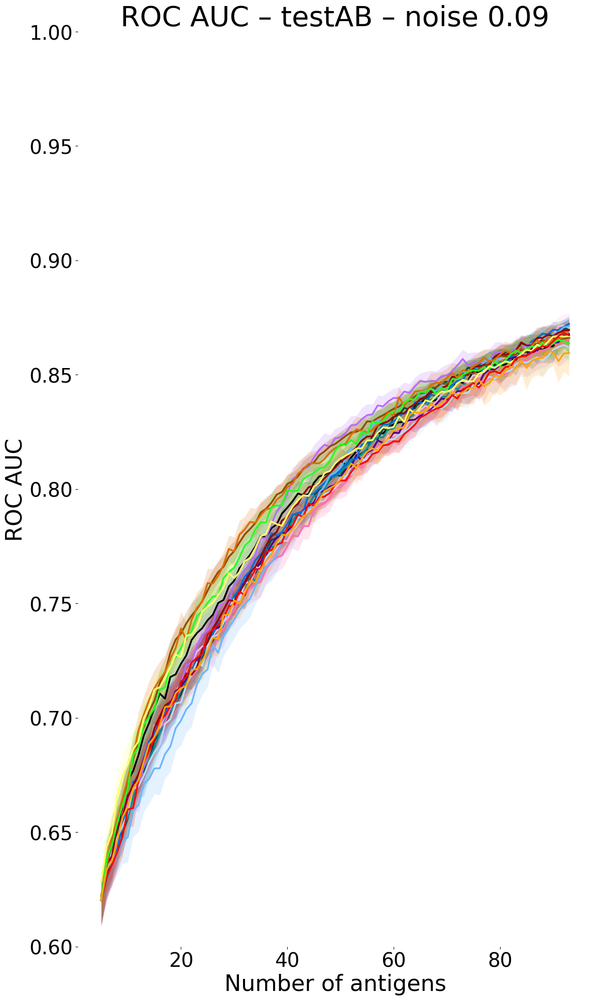

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.09.png


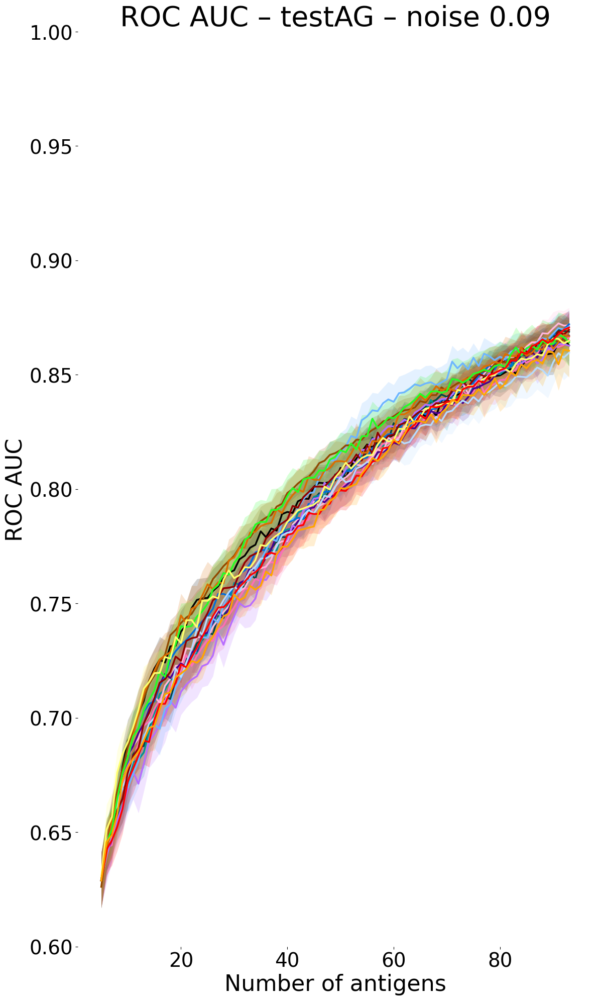

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.09.png


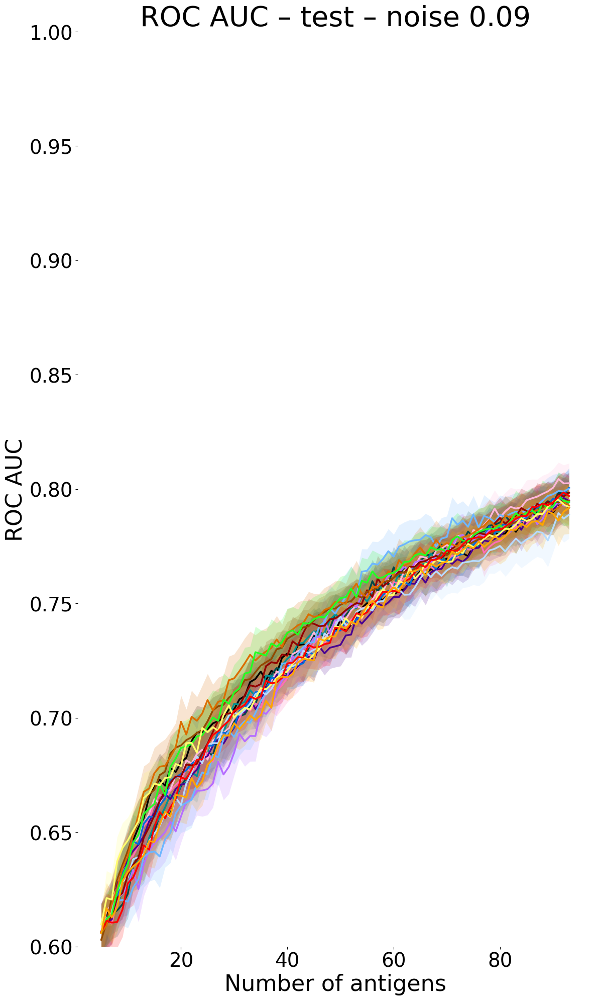

Collected dfw for noise=0.09, shape=(151300, 8)

--- processing noise=0.1 ---
Saved plot: ../results2/graphs/roc_auc_vs_ags_testAB_noise0.1.png


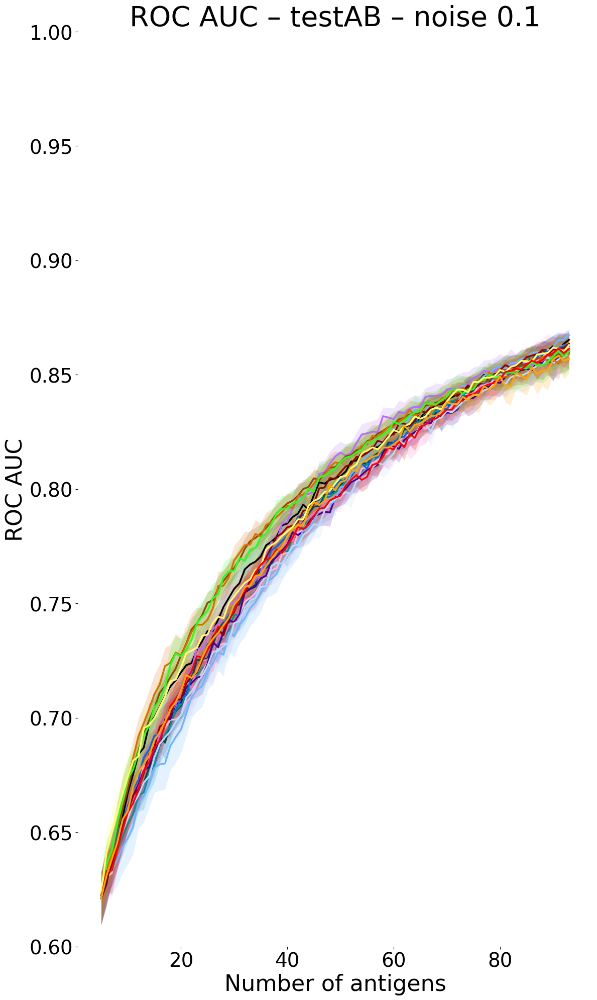

Saved plot: ../results2/graphs/roc_auc_vs_ags_testAG_noise0.1.png


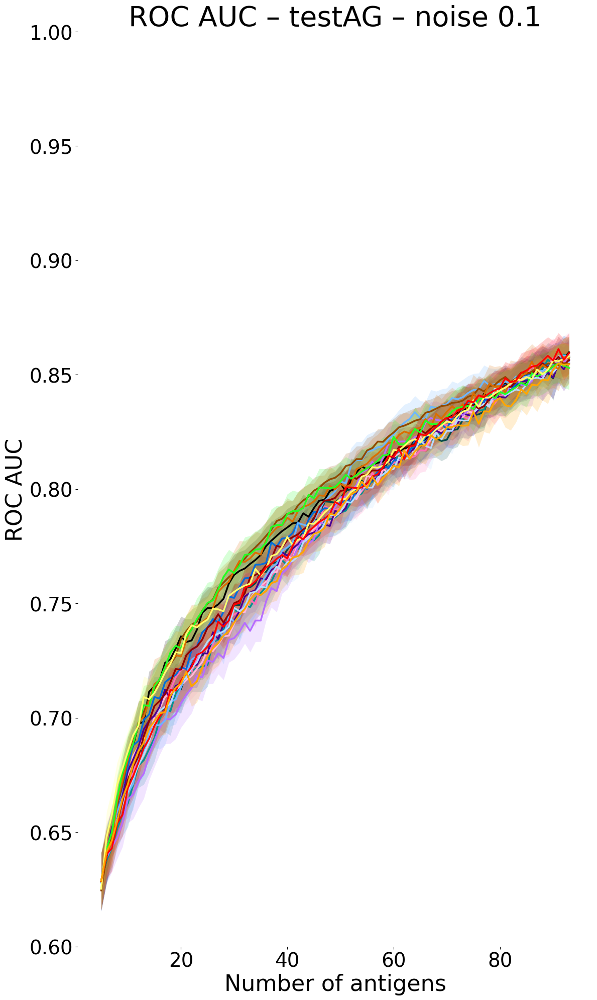

Saved plot: ../results2/graphs/roc_auc_vs_ags_test_noise0.1.png


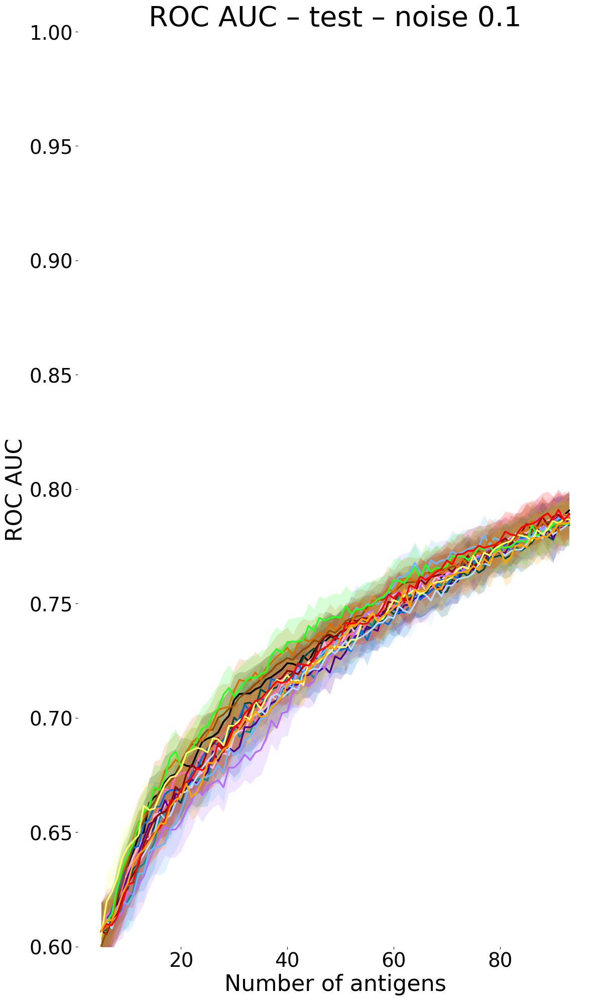

Collected dfw for noise=0.1, shape=(151300, 8)


In [3]:
METHOD_RE = re.compile(r"roc_aucs_(.+?)_(\d+)\.(tsv|csv)$")

out_base = os.path.join("..", graphs_dir)
os.makedirs(out_base, exist_ok=True)
os.makedirs(os.path.join(out_base, "means"), exist_ok=True)

def get_cmap_colors(name="tab20", min_len=20):
    try:
        cmap = mpl.colormaps.get_cmap(name)
    except Exception:
        cmap = plt.get_cmap(name)
    if hasattr(cmap, "colors"):
        colors = list(cmap.colors)
    else:
        N = getattr(cmap, "N", min_len)
        colors = [cmap(i / max(N - 1, 1)) for i in range(N)]
    return [mcolors.to_hex(c) for c in colors]

df_full = {}
for noise in noises:
    print(f"\n--- processing noise={noise} ---")
    base_dir = f"../results_small_final//noise{noise}"
    runs = [f"rand{i}" for i in range(100)]

    method_dfs = {}

    if not os.path.isdir(base_dir):
        print(f"Warning: base_dir {base_dir} not found — skipping noise={noise}")
        continue

    for run in runs:
        path = os.path.join(base_dir, run)
        if not os.path.exists(path):
            continue
        for file in os.listdir(path):
            if not file.startswith("roc_aucs_"):
                continue

            m = METHOD_RE.match(file)
            if m:
                method = m.group(1)
                ext = m.group(3)
            else:
                method = file.replace("roc_aucs_", "").rsplit(".", 1)[0]
                ext = file.rsplit(".", 1)[-1] if "." in file else "tsv"

            filepath = os.path.join(path, file)
            sep = "\t" if ext == "tsv" else ","
            try:
                df = pd.read_csv(filepath, sep=sep)
            except Exception as e:
                print(f"Warning: could not read {filepath}: {e}")
                continue

            if "ags_number" in df.columns:
                df["ags_number"] = pd.to_numeric(df["ags_number"], errors="coerce").astype("Int64")
            else:
                print(f"Warning: 'ags_number' not in {filepath}; skipping")
                continue

            df = df.assign(run_id=run)
            method_dfs.setdefault(method, []).append(df)

    if not method_dfs:
        print(f"No roc_aucs files found for noise={noise} under {base_dir}")
        continue

    if methods_lst:
        all_methods = [m for m in methods_lst if m in method_dfs]
        extras = sorted([m for m in method_dfs.keys() if m not in all_methods])
        all_methods += extras
    else:
        all_methods = sorted(method_dfs.keys())

    missing = [m for m in all_methods if m not in method_colors]
    if missing:
        base_colors = get_cmap_colors("tab20", min_len=max(20, len(missing)))
        for i, mm in enumerate(missing):
            method_colors[mm] = base_colors[i % len(base_colors)]

    for m in all_methods:
        method_labels.setdefault(m, m)

        import numpy as np  # вверху файла, если ещё не импортирован
    
    # заменяем внутренний блок for test in tests: на этот
    for test in tests:
        col = f"roc_aucs_{test}"
        plt.figure(figsize=(12, 20))
        ax = plt.gca()
        plotted_any = False
        means_export = {}
    
        for method in all_methods:
            dfs = method_dfs.get(method, [])
            if not dfs:
                continue
    
            try:
                df_all = pd.concat(dfs, ignore_index=True)
            except Exception as e:
                print(f"Warning: concat failed for method={method} at noise={noise}: {e}")
                continue
    
            if col not in df_all.columns:
                continue
    
            # группируем по ags_number и считаем статистики
            grouped = df_all.groupby("ags_number")[col]
            mean_series = grouped.mean().sort_index()
            if mean_series.empty:
                continue
            std_series = grouped.std().sort_index().reindex(mean_series.index).fillna(0.0)
            count_series = grouped.count().sort_index().reindex(mean_series.index).fillna(0).astype(int)
    
            # Можно использовать std как шлейф (вариант по умолчанию),
            # либо раскомментировать 95% CI и использовать его вместо std:
            ribbon_low = (mean_series - std_series).values
            ribbon_high = (mean_series + std_series).values
    
            # Для 95% CI по среднему (раскомментировать, если нужен CI):
            # sem = std_series / np.sqrt(count_series.replace(0, np.nan))
            # ci95 = 1.96 * sem
            # ribbon_low = (mean_series - ci95).values
            # ribbon_high = (mean_series + ci95).values
    
            x = mean_series.index.astype(int).values
            y = mean_series.values
    
            color = method_colors.get(method, "#000000")
            label = method_labels.get(method, method)
    
            # Рисуем непрерывную линию без маркеров
            ax.plot(x, y, label=label, color=color, linewidth=2.5, marker=None, linestyle='-')

            sem = std_series / np.sqrt(count_series.replace(0, np.nan))
            ci95 = 1.96 * sem
            
            # если хочешь точь-в-точь бутстрэп CI seaborn, надо запускать бутстрэп;
            # но для большинства случаев аналитический 95% CI достаточно
            ribbon_low = (mean_series - ci95).values
            ribbon_high = (mean_series + ci95).values
            
            # защита: если count==1 -> sem NaN, заменяем на 0 (или можно вообще не рисовать шлейф)
            ribbon_low = np.where(np.isnan(ribbon_low), mean_series.values, ribbon_low)
            ribbon_high = np.where(np.isnan(ribbon_high), mean_series.values, ribbon_high)
            
            # для метрик в диапазоне [0,1] — обрезаем
            ribbon_low = np.clip(ribbon_low, 0.0, 1.0)
            ribbon_high = np.clip(ribbon_high, 0.0, 1.0)
    
            # Рисуем шлейф/заполнение
            # защита от несовпадающих размеров (если вдруг пустые значения)
            if len(x) == len(ribbon_low) == len(ribbon_high):
                ax.fill_between(x, ribbon_low, ribbon_high, color=color, alpha=0.18, linewidth=0)
    
            means_export[method] = pd.Series(data=y, index=x)
            plotted_any = True
    
        if not plotted_any:
            print(f"No data for test={test} at noise={noise}")
            plt.show()
            plt.close()
            continue
    
        k = 2
        ax.set_xlabel("Number of antigens", fontsize=16*k)
        ax.set_ylabel(f"ROC AUC", fontsize=16*k)
        #ax.set_title(f"ROC AUC ({test})", fontsize=20*k)
        ax.set_title(f"ROC AUC – {test} – noise {noise}", fontsize=20*k)
        ax.tick_params(axis='both', which='major', labelsize=14*k)
        ax.set_frame_on(False)
        ax.set_ylim(0.6, 1.0)
    
        # при желании показать легенду (или сохранять её отдельно)
        # ax.legend(loc='lower right', fontsize=10*k, frameon=False, ncol=1)
    
        plt.tight_layout()
        out_png = os.path.join(out_base, f"roc_auc_vs_ags_{test}_noise{noise}.png")
        plt.savefig(out_png, dpi=150)
        print(f"Saved plot: {out_png}")
        plt.show()
        plt.close()
    
        df_means = pd.DataFrame(means_export).sort_index()
        out_csv = os.path.join(out_base, "means", f"mean_rocaucs_{test}_noise{noise}.csv")
        df_means.to_csv(out_csv, index_label="ags_number")


    dfq2_lst = []
    for m in all_methods:
        dfs = method_dfs.get(m, [])
        if not dfs:
            continue
        dfq2 = pd.concat(dfs, ignore_index=True)
        
        keep_cols = [c for c in ['iter', 'roc_auc_val', 'roc_aucs_test', 'roc_aucs_testAB',
                                  'roc_aucs_testAG', 'ags_number', 'run_id'] if c in dfq2.columns]
        dfq2 = dfq2[keep_cols].drop_duplicates().reset_index(drop=True)
        dfq2['method'] = m
        dfq2_lst.append(dfq2)

    if dfq2_lst:
        dfw = pd.concat(dfq2_lst, ignore_index=True)
    else:
        dfw = pd.DataFrame(columns=['iter', 'roc_auc_val', 'roc_aucs_test', 'roc_aucs_testAB',
                                    'roc_aucs_testAG', 'ags_number', 'run_id', 'method'])

    df_full[noise] = dfw
    print(f"Collected dfw for noise={noise}, shape={dfw.shape}")


# noise mix

Saved pooled plot: ../results2/graphs/roc_auc_vs_ags_testAB_all_noises_pooled.png


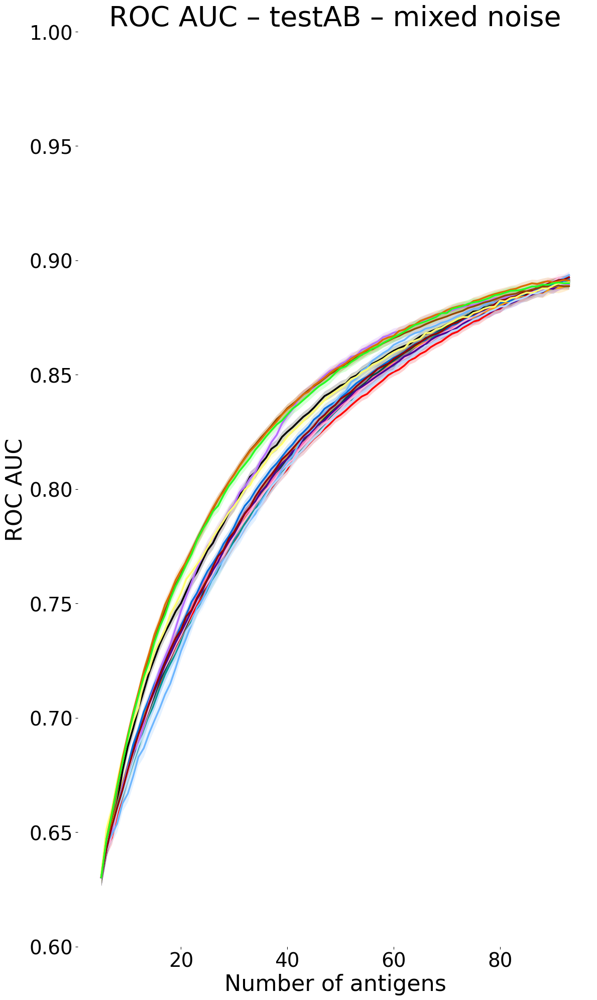

Saved pooled plot: ../results2/graphs/roc_auc_vs_ags_testAG_all_noises_pooled.png


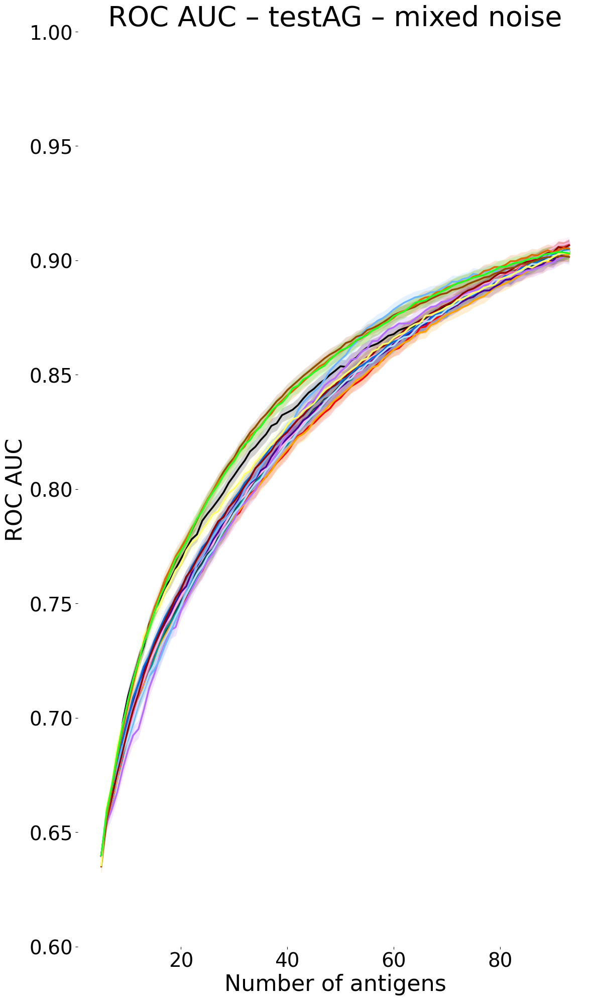

Saved pooled plot: ../results2/graphs/roc_auc_vs_ags_test_all_noises_pooled.png


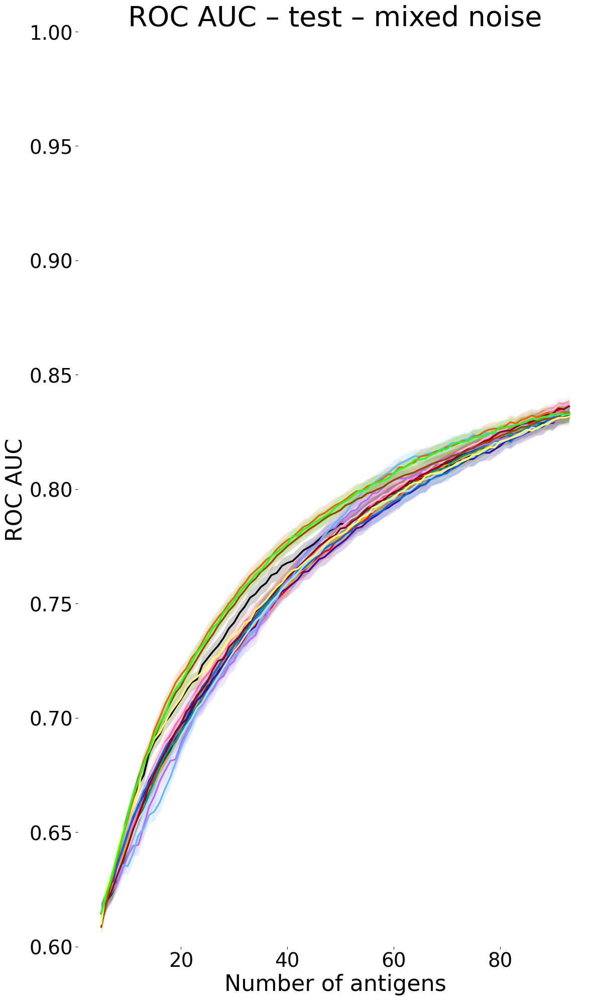

In [4]:
# === ОБЪЕДИНЁННЫЙ POOLED ГРАФИК (все записи вместе) ===
import numpy as np

# Список dataframes (игнорируем пустые)
all_dfs = [df.assign(noise=int(noise)) for noise, df in df_full.items() if not df.empty]
if not all_dfs:
    print("No data collected across noises — skipping pooled plots")
else:
    df_all_noises = pd.concat(all_dfs, ignore_index=True)

    for test in tests:
        col = f"roc_aucs_{test}"
        if col not in df_all_noises.columns:
            print(f"Column {col} not in pooled dataframe — skipping")
            continue

        plt.figure(figsize=(12, 20))
        ax = plt.gca()
        plotted_any = False
        means_export = {}

        # список всех методов в df_all_noises (чтобы не полагаться только на all_methods)
        pool_methods = sorted(df_all_noises['method'].unique())

        for method in pool_methods:
            df_m = df_all_noises[df_all_noises['method'] == method]
            if df_m.empty:
                continue

            grouped = df_m.groupby("ags_number")[col]
            mean_series = grouped.mean().sort_index()
            if mean_series.empty:
                continue
            std_series = grouped.std().sort_index().reindex(mean_series.index).fillna(0.0)
            count_series = grouped.count().sort_index().reindex(mean_series.index).fillna(0).astype(int)

            # 95% CI аналогично seaborn: mean +/- 1.96 * sem
            sem = std_series / np.sqrt(count_series.replace(0, np.nan))
            ci95 = 1.96 * sem
            ribbon_low = (mean_series - ci95).values
            ribbon_high = (mean_series + ci95).values
            ribbon_low = np.where(np.isnan(ribbon_low), mean_series.values, ribbon_low)
            ribbon_high = np.where(np.isnan(ribbon_high), mean_series.values, ribbon_high)
            ribbon_low = np.clip(ribbon_low, 0.0, 1.0)
            ribbon_high = np.clip(ribbon_high, 0.0, 1.0)

            x = mean_series.index.astype(int).values
            y = mean_series.values

            color = method_colors.get(method, "#000000")
            label = method_labels.get(method, method)

            ax.plot(x, y, label=label, color=color, linewidth=2.5, marker=None, linestyle='-')
            if len(x) == len(ribbon_low) == len(ribbon_high):
                ax.fill_between(x, ribbon_low, ribbon_high, color=color, alpha=0.18, linewidth=0)

            means_export[method] = pd.Series(data=y, index=x)
            plotted_any = True

        if not plotted_any:
            print(f"No pooled data for test={test}")
            plt.close()
            continue

        k = 2
        ax.set_xlabel("Number of antigens", fontsize=16*k)
        ax.set_ylabel("ROC AUC", fontsize=16*k)
        ax.set_title(f"ROC AUC – {test} – mixed noise", fontsize=20*k)
        ax.tick_params(axis='both', which='major', labelsize=14*k)
        ax.set_frame_on(False)
        ax.set_ylim(0.6, 1.0)
        # ax.legend(loc='lower right', fontsize=10*k, frameon=False)

        out_png = os.path.join(out_base, f"roc_auc_vs_ags_{test}_all_noises_pooled.png")
        plt.tight_layout()
        plt.savefig(out_png, dpi=150)
        print(f"Saved pooled plot: {out_png}")
        plt.show()
        plt.close()

        df_means = pd.DataFrame(means_export).sort_index()
        out_csv = os.path.join(out_base, "means", f"mean_rocaucs_{test}_all_noises_pooled.csv")
        df_means.to_csv(out_csv, index_label="ags_number")


# stats

In [5]:
import numpy as np
import pandas as pd
from scipy import stats


tests = {
    "test": "roc_aucs_test",
    "testAB": "roc_aucs_testAB",
    "testAG": "roc_aucs_testAG"
}

def compute_auc_per_run_method(df, value_col, x_col='ags_number', run_col='run_id', method_col='method'):
    records = []
    for (run_id, method), sub in df.groupby([run_col, method_col]):
        sub2 = sub.dropna(subset=[x_col, value_col])
        if sub2.empty:
            auc = np.nan
        else:
            s = sub2.groupby(x_col)[value_col].mean().sort_index()
            if s.shape[0] >= 2:
                x = s.index.astype(float).to_numpy()
                y = s.values.astype(float)
                auc = np.trapezoid(y=y, x=x)
            else:
                auc = np.nan
        records.append({'run_id': str(run_id), 'method': method, 'auc': float(auc) if not np.isnan(auc) else np.nan})
    return pd.DataFrame.from_records(records)

def paired_tests_vs_random(aucs_long_df, alpha=0.05, alternative='two-sided'):
    results = []
    tests_list = sorted(aucs_long_df['test'].unique())
    for test in tests_list:
        sub = aucs_long_df[aucs_long_df['test'] == test]
        methods = sorted(sub['method'].unique())
        if 'random' not in methods:
            print(f"Test {test}: no 'random' method found — skipping")
            continue
        methods_to_test = [m for m in methods if m != 'random']
        m = len(methods_to_test)
        for method in methods_to_test:
            a = sub[sub['method'] == method][['run_id','auc']].set_index('run_id')
            b = sub[sub['method'] == 'random'][['run_id','auc']].set_index('run_id')
            paired = a.join(b, how='inner', lsuffix='_m', rsuffix='_r').dropna()
            n_pairs = paired.shape[0]
            if n_pairs < 2:
                results.append({
                    'test': test, 'method': method, 'n_pairs': n_pairs,
                    'mean_method': np.nan, 'mean_random': np.nan, 'mean_diff': np.nan,
                    't_stat': np.nan, 'p_val': np.nan, 'p_adj': np.nan, 'reject': False, 'cohen_d': np.nan
                })
                continue

            x = paired['auc_m'].to_numpy(dtype=float)
            y = paired['auc_r'].to_numpy(dtype=float)
            diff = x - y
            mean_method = x.mean()
            mean_random = y.mean()
            mean_diff = diff.mean()
            sd_diff = diff.std(ddof=1)

            try:
                t_res = stats.ttest_rel(x, y, alternative=alternative)
                t_stat = float(t_res.statistic)
                p_val = float(t_res.pvalue)
            except TypeError:
                t_stat, p_two = stats.ttest_rel(x, y)
                if alternative == 'two-sided':
                    p_val = float(p_two)
                elif alternative == 'greater':
                    p_val = float(p_two/2) if t_stat > 0 else 1.0 - float(p_two/2)
                else:
                    p_val = float(p_two)

            cohen_d = (mean_diff / sd_diff) if sd_diff > 0 else np.nan

            # Bonferroni correction across methods for this test
            p_adj = min(p_val * m, 1.0) if m > 0 else p_val
            reject = (p_adj < alpha)

            results.append({
                'test': test, 'method': method, 'n_pairs': n_pairs,
                'mean_method': mean_method, 'mean_random': mean_random, 'mean_diff': mean_diff,
                't_stat': t_stat, 'p_val': p_val, 'p_adj': p_adj, 'reject': bool(reject),
                'cohen_d': cohen_d
            })

    results_df = pd.DataFrame(results)
    cols = ['test','method','n_pairs','mean_method','mean_random','mean_diff',
            't_stat','p_val','p_adj','reject','cohen_d']
    results_df = results_df[[c for c in cols if c in results_df.columns]]
    return results_df

def f2(dfe):
    aucs_dfs = []
    for test_name, col in tests.items():
        
        if col not in dfe.columns:
            print(f"Warning: column {col} not found in dfe — skipping {test_name}")
            continue
        a = compute_auc_per_run_method(dfe, value_col=col, x_col='ags_number', run_col='run_id', method_col='method')
        a['test'] = test_name
        aucs_dfs.append(a)
    
    if not aucs_dfs:
        raise RuntimeError("No AUCs computed: none of the requested columns found in dfe.")
    
    aucs_long = pd.concat(aucs_dfs, ignore_index=True)
    ttest_results = paired_tests_vs_random(aucs_long, alpha=0.05, alternative='greater')

    return ttest_results


In [ ]:
ttest_results_noises = []

for noise in noises:

    dfe = df_full[noise]
    ttest_results = f2(dfe)
    dfr = ttest_results[ttest_results.reject]
    print('noise:', noise)
    print(dfr[['test', 'method', 'mean_method', 'mean_random', 'p_adj', 'reject']])
    print()
    print()
    ttest_results['noise'] = noise
    ttest_results_noises.append(ttest_results)

ttest_df = pd.concat(ttest_results_noises, ignore_index=True)
ttest_df.to_csv("../"+stats_dir+f"/ttest.csv", index=False)


noise: 0
      test         method  mean_method  mean_random     p_adj  reject
29  testAB            qbc    75.810954    75.413378  0.009868    True
30  testAB  threshold_avg    75.955427    75.413378  0.004453    True
31  testAB  threshold_max    75.973895    75.413378  0.001075    True
47  testAG  threshold_max    78.144875    77.502435  0.045211    True


noise: 0.01
      test         method  mean_method  mean_random     p_adj  reject
14    test  threshold_avg    71.420628    70.300059  0.000637    True
15    test  threshold_max    71.376438    70.300059  0.001841    True
29  testAB            qbc    75.113760    74.665837  0.011860    True
30  testAB  threshold_avg    75.339265    74.665837  0.000063    True
31  testAB  threshold_max    75.260328    74.665837  0.001522    True
45  testAG            qbc    76.994097    76.293698  0.031811    True
46  testAG  threshold_avg    77.197994    76.293698  0.002774    True
47  testAG  threshold_max    77.203618    76.293698  0.002702    Tr

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df_color = pd.DataFrame({"method": methods_lst, "color": base_palette})

def hex_to_rgb(hexc):
    hexc = hexc.lstrip('#')
    return tuple(int(hexc[i:i+2], 16) for i in (0, 2, 4))

def readable_text_color(hexc):
    r, g, b = hex_to_rgb(hexc)
    lum = 0.299*r + 0.587*g + 0.114*b
    return 'black' if lum > 150 else 'white'

fig, ax = plt.subplots(figsize=(8, 6))
y_positions = list(range(len(df_color)))
ax.barh(y_positions, [1]*len(df_color), color=df_color['color'], edgecolor='none', height=0.8)
ax.set_yticks(y_positions)
ax.set_yticklabels(df_color['method'], fontsize=10)
ax.set_xticks([])
ax.set_xlim(0, 1)
ax.invert_yaxis()

for i, hexc in enumerate(df_color['color']):
    txt_color = readable_text_color(hexc)
    ax.text(0.02, i+0.0, hexc, va='center', ha='left', fontsize=9, color=txt_color, weight='bold')

for spine in ax.spines.values():
    spine.set_visible(False)
ax.set_title("Correspondence of methods and colors", fontsize=12)
plt.tight_layout()

out_png = os.path.join(out_base, f"colors.png")
plt.savefig(out_png, dpi=150)
print(f"Saved plot: {out_png}")

plt.show()
